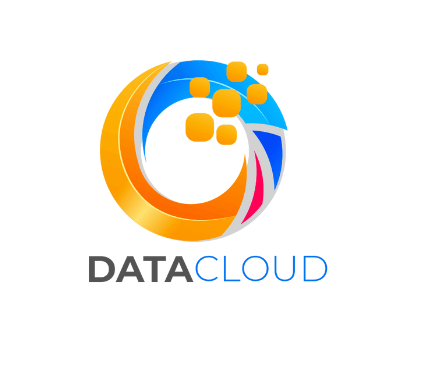

<a id="cont"></a>

# Table of contents

<a href=#one>1. Introduction</a>

<a href=#two>2. Importing Packages</a>

<a href=#three>3. Loading Data</a>

<a href=#four>4. Exploratory Data Analysis</a>

<a href=#five>5. Feature Engineering</a>

<a href=#six>6. Model Building</a>

<a href=#seven>7. Model Evaluation</a>

<a href=#eight>8. Model Selection</a>

<a href=#nine>9. Conclusion</a>

<a href=#ten>10. Kaggle Submission</a>

<a href=#eleven>11. Log Comet Experiments</a>


 <a id="one"></a>
 # 1. Introduction
 <a href=#cont>Back to Table of Contents</a>

This notebook demonstrates the entire data science workflow used to build models, analyze models and select the best model to solve a sentiment analysis classification challenge.

## 1.1 Problem Statement

The challenge alluded to above is to determine people's perception on climate change, whether they believe that climate change is real and if it is a threat. The aim of this project is to create a machine learning model that uses natural language processing to determine a person's view on climate change based on their tweet data. The model should be able to accurately classify people into groups of those who believe in climate change and those who do not. With this, our company DataCloud, will be able to offer insights to marketing departments on how well or badly their product will be recieved on the market  based on its effects on the climate. This will help marketing teams to come up with strategies on how to run their campaigns in the future.

## 1.2 The dataset
---
we are provided with a dataset containing tweets collected from 27/04/2015 to 21/02/2018. The dataset contains three features;

* sentiment - the class in which a tweet belongs ranging
 from -1 to 2

* message - The body of the tweet provided

* tweetid - a unique identifier for each tweet

The dataset is split into training data and test data with training data containing 80% of the data



 <a id="two"></a>
 # 2. Importing Packages
 <a href=#cont>Back to Table of Contents</a>



 
In this section, the necessary packages to be used throughout the notebook are imported, and briefly discussed. 
The imported libraries are used in the following stages of the data science process : data cleaning, exploratory data analysis and data modelling. 


In [1]:
# import libraries for use in loading data, EDA and data manipulation
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import nltk
import contractions
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
import advertools as adv
from wordcloud import WordCloud
import string
import urllib
from sklearn.utils import resample

nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('omw-1.4')

#import libraries for use in model development
import sklearn
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split

# import libraries for use in model evaluation
from sklearn import metrics 
from sklearn.metrics import classification_report, accuracy_score, f1_score, precision_score, recall_score

# import comet for version control
import comet_ml
from comet_ml import Experiment




[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Mariam\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Mariam\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Mariam\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


 <a id="three"></a>
 # 3. Loading Data
<a href=#cont>Back to Table of Contents</a>

---
    
In this section, the datasets to be used in the modelling process are loaded into DataFrames using the pandas library. 



In [2]:
#Load the csv file containing the training data using pandas
train_df = pd.read_csv("train.csv")

#Load the csv file containing the test data using pandas
test_df = pd.read_csv("test_with_no_labels.csv")


 <a id="four"></a>
 # 4. Exploratory Data Analysis
 
 <a href=#cont>Back to Table of Contents</a>

---

In this section, an in-depth analysis of all the variables in the DataFrame is performed. 
This phase of the project cycle is very important; it offers insight into the data, and any underlying patterns within it, 
as well as any errors, duplicates or outliers present. 
It is essential in understanding the data objectively and guides the data pre-processing and modelling processes. 
The investigations conducted include: the dimensionality of the data, the descriptive statistics, data completeness, 
data distribution, existence of outliers and duplicates, as well as tweet entity extraction, analysis and visualisation.



## 4.1 Basic Analysis
---
In this portion of the EDA, the basic characteristics of the dataset are examined in a non-graphical manner. It includes data previewing, data dimensionality, data summary, data completeness, data distribution, as well as existence of outliers and duplicates.

In [3]:
# print out a section of the dataset
train_df.head()

,sentiment,message,tweetid
0,1,PolySciMajor EPA chief doesn't think carbon di...,625221
1,1,It's not like we lack evidence of anthropogeni...,126103
2,2,RT @RawStory: Researchers say we have three ye...,698562
3,1,#TodayinMaker# WIRED : 2016 was a pivotal year...,573736
4,1,"RT @SoyNovioDeTodas: It's 2016, and a racist, ...",466954


In [4]:
# Check dataset shape
train_df.shape

(15819, 3)

The train dataset has 15,819 rows and 3 columns.

In [5]:
# Summarize data
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15819 entries, 0 to 15818
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   sentiment  15819 non-null  int64 
 1   message    15819 non-null  object
 2   tweetid    15819 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 370.9+ KB


Two of the columns are numeric type columns: i.e `sentiment` and `tweetid`; with `sentiment` being the encoded categorical target variable. The other column; `message` is of object type. The output also shows that there are no null values in this dataset.

In [6]:
# look at data statistics - numeric type columns
train_df.describe()

,sentiment,tweetid
count,15819.000000,15819.000000
mean,0.917504,501719.433656
std,0.836537,289045.983132
min,-1.000000,6.000000
25%,1.000000,253207.500000
50%,1.000000,502291.000000
75%,1.000000,753769.000000
max,2.000000,999888.000000


The descriptive statistics of the numeric variables do not offer much insight. This is because the `tweetid` column is a unique column while the `sentiment` column is an encoded categorical column.

In [7]:
# look at data statistics - object type columns
train_df.describe(include=['O'])

,message
count,15819
unique,14229
top,RT @StephenSchlegel: she's thinking about how ...
freq,307


The descriptive statistics of the `message` column suggest that there are duplicate tweets in the data. This may be a case of retweets or copied tweets. The most common tweet in the dataset is a retweet(due to the `RT` tag) and it appears 307 times throughout the dataset.

In [8]:
# Count of unique values in each column
train_df.nunique()

sentiment        4
message      14229
tweetid      15819
dtype: int64

The `tweetid` column contains all-unique values while the `message` column has some duplicate values. The target variable; `sentiment`, contains 4 different class labels.

In [9]:
# Showcase the duplicate tweets in the message column
train_df.loc[train_df['message'].duplicated(keep=False)]

,sentiment,message,tweetid
10,1,RT @StephenSchlegel: she's thinking about how ...,295793
17,1,RT @patagonia: If our elected leaders fail to ...,490604
18,1,RT @SenSanders: We have a president-elect who ...,228658
21,1,RT @World_Wildlife: How climate change impacts...,690605
35,1,RT @BernieSanders: #ImVotingBecause the future...,817108
...,...,...,...
15781,1,RT @StephenSchlegel: she's thinking about how ...,869993
15799,1,RT @SethMacFarlane: HRC proposes installing ha...,52528
15801,1,RT @SenSanders: On virtually every major issue...,331127
15811,1,RT @StephenSchlegel: she's thinking about how ...,426353


There are 1,908 duplicate tweets in the `message` column. These tweets might be duplicates but are all associated with different unique tweet IDs.

In [10]:
train_df.loc[train_df['message'].duplicated(keep=False) & train_df['message'].str.contains('RT')]

,sentiment,message,tweetid
10,1,RT @StephenSchlegel: she's thinking about how ...,295793
17,1,RT @patagonia: If our elected leaders fail to ...,490604
18,1,RT @SenSanders: We have a president-elect who ...,228658
21,1,RT @World_Wildlife: How climate change impacts...,690605
35,1,RT @BernieSanders: #ImVotingBecause the future...,817108
...,...,...,...
15781,1,RT @StephenSchlegel: she's thinking about how ...,869993
15799,1,RT @SethMacFarlane: HRC proposes installing ha...,52528
15801,1,RT @SenSanders: On virtually every major issue...,331127
15811,1,RT @StephenSchlegel: she's thinking about how ...,426353


Out of all 1,908 duplicate tweets, majority (i.e 1,899) are retweets as is evidenced by the `RT` tag.

In [11]:
train_df.loc[train_df['message'].duplicated(keep=False) & ~train_df['message'].str.contains('RT')]

,sentiment,message,tweetid
2831,0,Kentut dari hewan-hewan purba adalah penyebab ...,469251
5582,-1,There has been no statistically significant gl...,8864
7283,-1,There has been no statistically significant gl...,930214
7488,1,Research - to examine a lifestyle contributing...,695821
10516,0,Kentut dari hewan-hewan purba adalah penyebab ...,320994
11324,0,Kentut sapi termasuk penyebab utama global war...,701584
13946,0,Kentut sapi termasuk penyebab utama global war...,108948
14249,0,Kentut dari hewan-hewan purba adalah penyebab ...,687847
14932,1,Research - to examine a lifestyle contributing...,177380


Out of all 1,908 duplicate tweets, 308 of them appear to be copied tweets.

In [12]:
# Investigate feature symmetry
train_df.skew(numeric_only=True)

sentiment   -0.683959
tweetid     -0.008471
dtype: float64

The `sentiment` column has a moderate negative skew, and this is as a result of the labels chosen for encoding the variable (i.e: -1, 0, 1 and 2);
while `tweetid` has a fairly symmetrical distribution.

In [13]:
# Evaluate existence of outliers in the data using kurtosis
train_df.kurt(numeric_only=True)

sentiment    0.122976
tweetid     -1.193356
dtype: float64

Both numeric columns show no evidence of the existence of outliers.

## 4.2 Tweet Length Distribution

The distribution below indicates a negative skew; the bulk of the observations are medium-length tweets. Majority of the tweets are between 125 and 150 characters long.

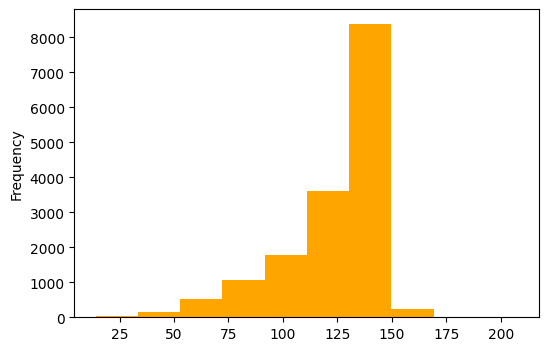

In [14]:
# checking the distribution of tweet length in the dataset
length_train = train_df['message'].str.len().plot.hist(color = 'orange', figsize = (6, 4))

## 4.3 Target Variable Distribution
---
The pro label is the most frequent category in this dataset; with 8,530 tweets labeled as 1 for supporting belief in man-made climate change, while the least; 1,296 tweets are labeled as -1, for tweets that do not believe in man-made climate change. 
There is also evidence of class imbalance within our dataset that will need to be remedied using methods such as resampling techniques to ensure predictability of the model.

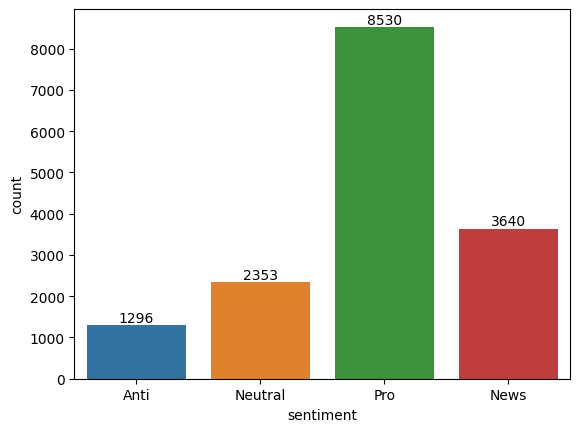

In [15]:
# plot distribution plots of the target variable
f = sns.countplot(x='sentiment', data=train_df)
f.set_xticklabels(['Anti', 'Neutral', 'Pro', 'News'])
f.bar_label(f.containers[0])
plt.show() 

## 4.4 Copy Creation and Data Segmentation by Label
---
Here, a copy of the dataframe is created to be used for further visual analysis so as to preserve the original dataframe. The copy of the dataframe is then divided into subsets as per the categories.

In [16]:
# Create a copy of the train data to use for extracting twitter-related information
df = train_df.copy()

In [17]:
# Get subsets of the data as per the label.
news_data = df[df['sentiment'] == 2]
pro_data = pd.DataFrame(df[df['sentiment'] == 1])
neutral_data = df[df['sentiment'] == 0]
anti_data = df[df['sentiment'] == -1]

## 4.5 Hashtag Extraction
---
Hashtags are popular on Twitter and they are used to index and group tweets around a particular topic. In this segment, hashtags are extracted from tweets using advertools and visualised using wordclouds.

In [18]:
# Extract all hashtags from the dataframe using advertools
hashtag_summary = adv.extract_hashtags(df['message'])
hashtag_summary['overview']

{'num_posts': 15819,
 'num_hashtags': 4139,
 'hashtags_per_post': 0.2616473860547443,
 'unique_hashtags': 1783}

The data has a significant amount of hashtags. It would be beneficial to explore the popular hashtags in this data and further determine the popular hashtags per tweet category. 

In [19]:
#Function to extract hashtags
def hashtag_extractor(data):
    
    """
    This function extracts all the hashtags from a collection of tweets using advertools.
        Input: a tweet column from a dataframe
        Output: a sequence of strings(hashtags) separated by space
    """ 
    hashtag_summary = adv.extract_hashtags(data)
    hashtags = hashtag_summary['hashtags_flat'] #Create a list of all the available hashtags.
    tags = (" ").join(hashtags) #Create a sequence of strings from the hashtags list
    
    return tags

In [20]:
# Function to create a wordcloud using the extracted entities
def wordcloud_visualizer(extracted_entity, color):
    
     
    """
    This function creates a wordclod visual from a collection of extracted entities.
    It uses the WordCloud function from wordcloud to create a wordcloud of the extracted entities with a white background.
        Input: a sequence of stings of the extracted entity, preferred color scheme for the wordcloud
        Output: a wordcloud visual
    """  
    wordcloud = WordCloud(collocations = False, colormap = color, background_color = 'white').generate(extracted_entity)
    
    return wordcloud

In [21]:
# Use the hashtag extractor function to extract hashtags from the different subsets of the data
all_tags = hashtag_extractor(df['message'])
news_tags = hashtag_extractor(news_data['message'])
pro_tags = hashtag_extractor(pro_data['message'])
neutral_tags = hashtag_extractor(neutral_data['message'])
anti_tags = hashtag_extractor(anti_data['message'])

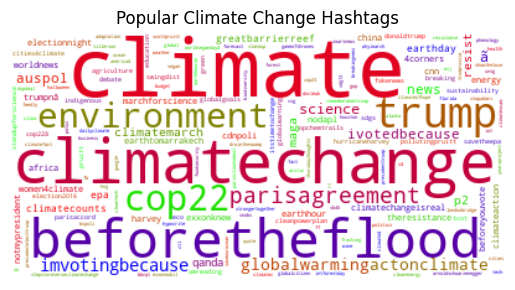

In [22]:
# Generate a wordcloud for all the hashtags available in the full data
full_data_cloud = wordcloud_visualizer(all_tags, 'brg')
# Display the generated Word Cloud
plt.imshow(full_data_cloud, interpolation='bilinear')
plt.axis("off")
plt.title('Popular Climate Change Hashtags')
plt.show()

* As would be expected, words such as: `climate`, `climatechange`, `environment`, `actonclimate` and `globalwarming` constitute the most popular hashtags in this data. As previously established, hashtags are used to index and group tweets around a particular topic and the aforementioned hashtags would be the most appropriate tags for the climate change topic.


* `BeforetheFlood` is among the most popular climate change hashtags. It is in reference to a film produced by Leonardo DiCaprio that was released in  21 October 2016. The film highlights the dangers of climate change and the possible solutions.


* `Imvotingbecause` and `Ivotedbecause` hashtags are prominent in the data as well. Climate change has become a political issue over the decades and is very central to American politics. These hashtags are used throughout the dataset to show support in the now-politicized climate change issue by voters.


* `COP22` is a popular hashtag and aligns with the timeframe of the collected data. It stands for the 22nd Session of the Conference of the Parties, the 2016 United Nations Climate Change Conference. It was an international meeting of political leaders and activists to discuss environmental issues, and was held in Marrakech, Morocco, on 7–18 November 2016. Naturally, this conference sparked a lot of debate and conversation on the topic of climate change. 


* `TheParisAgreement` hashtag aligns with the timeframe of the collected data as well. It is a legally binding international treaty on climate change that was adopted by 196 Parties at COP 21 in Paris, on 12 December 2015. The agreement covers climate change mitigation, adaptation, and finance.


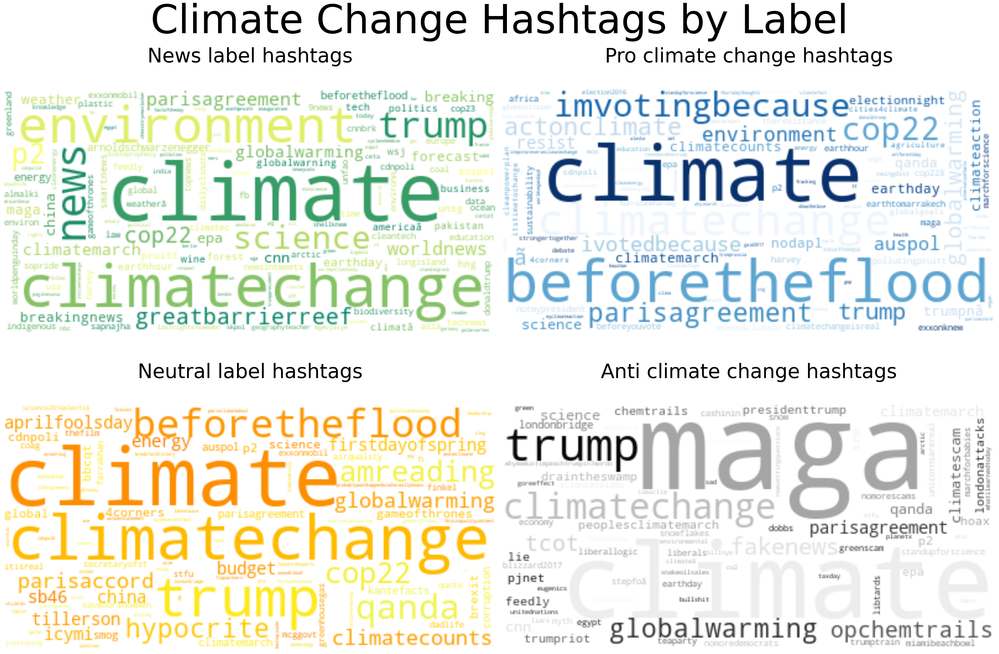

In [23]:
# Display the generated wordclouds for the different labels
f, axarr = plt.subplots(2,2, figsize=(35,25))
axarr[0,0].imshow(wordcloud_visualizer(news_tags, 'summer'), interpolation="bilinear")
axarr[0,1].imshow(wordcloud_visualizer(pro_tags, 'Blues'), interpolation="bilinear")
axarr[1,0].imshow(wordcloud_visualizer(neutral_tags, 'Wistia'), interpolation="bilinear")
axarr[1,1].imshow(wordcloud_visualizer(anti_tags, 'gist_gray'), interpolation="bilinear")

# Remove the ticks on the x and y axarres
for ax in f.axes:
    plt.sca(ax)
    plt.axis('off')

axarr[0,0].set_title('News label hashtags\n', fontsize=50)
axarr[0,1].set_title('Pro climate change hashtags\n', fontsize=50)
axarr[1,0].set_title('Neutral label hashtags\n', fontsize=50)
axarr[1,1].set_title('Anti climate change hashtags\n', fontsize=50)
plt.suptitle("Climate Change Hashtags by Label", fontsize = 100)
plt.tight_layout()
plt.show()



* `Trump` is a popular hashtag across the labels in the climate change tweets. Trump's administration saw alot of controversial moves and statements around climate change. Most of his efforts were geared towards dismissing climate change and slowing down efforts to mitigate it; including withdrawal from the 2015 Paris Climate Change agreement where 196 nations pledged to reduce greenhouse gas emissions and assist poor nations struggling with the consequences of global warming. Tweets including this hashtag are most likely centered around people's opinions, criticism and/ or support of Trump's views on climate change.


* Anti climate change hashtags are laden with former president Trump's slogans and declarations. For example, `DraintheSwamp` and `maga`, which was his slogan during the 2016 campaigns and stands for 'Make America Great Again'. Majority of the hashtags in the anti climate change subset of the data seem to be skeptical and to question the reality of the climate issue e.g `fakenews`, `myth`, `hoax`, `climatescam` and `greenscam`. The inclusion of `tcot`, meaning Top Conservatives on Twitter, suggest that anti climate change tweets are favored by Republican-leaning users.


* Pro, News and Neutral tweets seem to share more or less the same hashtags, with Pro tweets having inclusions of vote-related hashtags eg `Imvotingbecause`, News label tweets include broadcast entities eg `CNN` AND `WorldNews`. The apparance of `P2` (Progressives 2.0) hashtags on these labels suggests that these type of tweets are mostly favored by Democrat-leaning users and are used to show progressive political standpoints on Twitter.


## 4.6 Username Extraction
---
Mentioning a user on Twitter is an effective way to grab that user's attention, and can showcase the major stakeholders in climate change conversations on Twitter. In this segment, mentioned usernames are extracted from tweets using advertools and visualised using wordclouds.

In [24]:
# Extract all mentions from the dataframe using advertools
mention_summary = adv.extract_mentions(df['message'])
mention_summary['overview']

{'num_posts': 15819,
 'num_mentions': 14742,
 'mentions_per_post': 0.9319173146216575,
 'unique_mentions': 7517}

The data has a significant amount of mentions. These are most-likely politicians and celebrities who have made public their opinions on climate change and are sparking a lot of conversation on the issue.

In [25]:
#Function to extract mentionss
def mentions_extractor(data):
    
    """
    This function extracts all the mentions from a collection of tweets using advertools.
        Input: a tweet column from a dataframe
        Output: a sequence of strings(mentions) separated by space
    """ 
    mentions_summary = adv.extract_mentions(data)
    mentions = mentions_summary['mentions_flat'] #Create a list of all the available mentions.
    usernames = (" ").join(mentions) #Create a sequence of strings from the mentions list
    
    return usernames

In [26]:
# Use the mentions extractor function to extract mentionss from the different subsets of the data
all_mentions = mentions_extractor(df['message'])
news_mentions = mentions_extractor(news_data['message'])
pro_mentions = mentions_extractor(pro_data['message'])
neutral_mentions = mentions_extractor(neutral_data['message'])
anti_mentions = mentions_extractor(anti_data['message'])

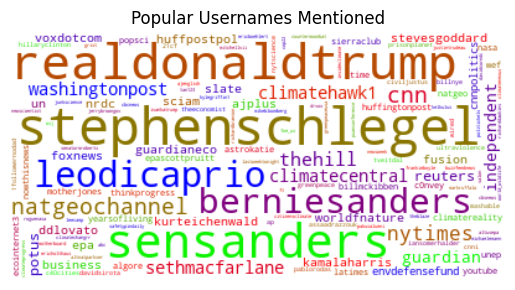

In [27]:
# Generate a wordcloud for all the mentions available in the full data
full_data_cloud = wordcloud_visualizer(all_mentions, 'brg')
# Display the generated Word Cloud
plt.imshow(full_data_cloud, interpolation='bilinear')
plt.axis("off")
plt.title('Popular Usernames Mentioned')
plt.show()

* `Stephen Schlegel` is among the most frequently mentioned usernames in this data. His tweet received alot of excitement after making a quip at former first lady, Melania Trump for her husband's beliefs on climate change. It received a lot of retweets. The basic analysis section of this EDA showed that the most common tweets in this dataset are retweets of this user's tweet with a frequency of 307. 


* The most frequently mentioned users are either politicians or celebrities who have made remarks on climate change that have been met by criticism, support or both by the general public. Celebrities include: `Leo Dicaprio`, `Seth Macfarlane` and `D D Lovato`; politicians include: `Donald Trump`, `Bernie Sanders` and `Kamala Harris`; and Journalists such as `Kurt Eichenwald`. 


* The other most mentioned entities are broadcast and news channels eg `CNN`, newspaper publications eg `NYTimes` and magazines such as `Mother Jones`

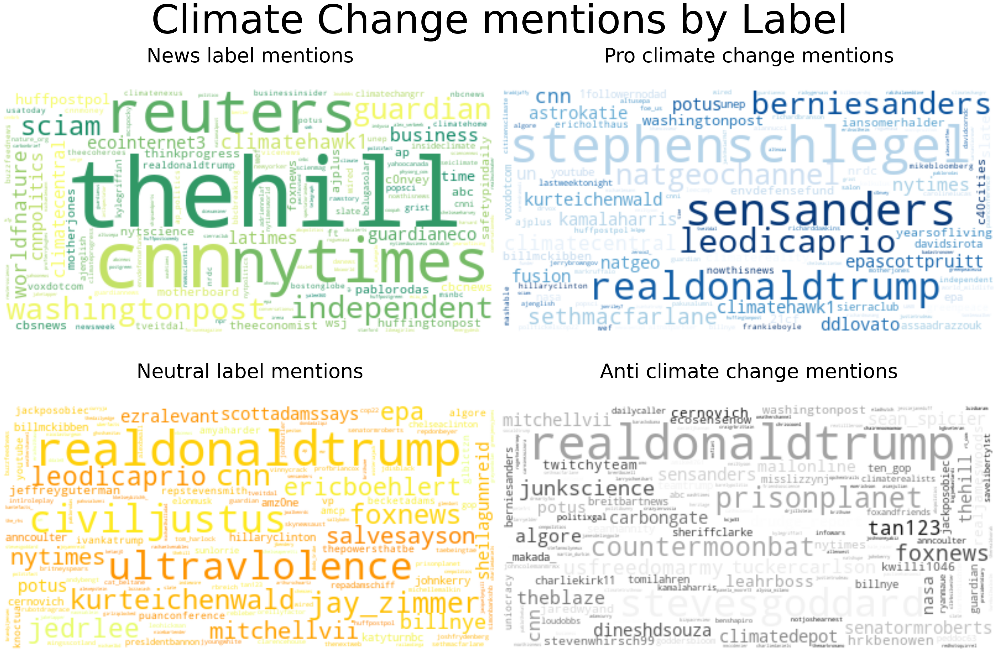

In [28]:
# Display the generated wordclouds for the different labels
f, axarr = plt.subplots(2,2, figsize=(35,25))
axarr[0,0].imshow(wordcloud_visualizer(news_mentions, 'summer'), interpolation="bilinear")
axarr[0,1].imshow(wordcloud_visualizer(pro_mentions, 'Blues'), interpolation="bilinear")
axarr[1,0].imshow(wordcloud_visualizer(neutral_mentions, 'Wistia'), interpolation="bilinear")
axarr[1,1].imshow(wordcloud_visualizer(anti_mentions, 'gist_gray'), interpolation="bilinear")

# Remove the ticks on the x and y axarres
for ax in f.axes:
    plt.sca(ax)
    plt.axis('off')

axarr[0,0].set_title('News label mentions\n', fontsize=50)
axarr[0,1].set_title('Pro climate change mentions\n', fontsize=50)
axarr[1,0].set_title('Neutral label mentions\n', fontsize=50)
axarr[1,1].set_title('Anti climate change mentions\n', fontsize=50)
plt.suptitle("Climate Change mentions by Label", fontsize = 100)
plt.tight_layout()
plt.show()



* `Donald Trump` is the most mentioned person throughout the labels. This could be because of his strong opinions on climate change that are met by equally strong opposition or support by Twitter users.


* The news label is characterized by mentions targeting news/information outlets; most prominent being `The Hill`, `NY Times`, `Reuters`, `Washington Post` and `Independent`, all which have exemplary climate news coverage and  Twitter users are likely tagging them or following developing climate change news from them.


* The Pro label is characterized by mentions of people who are actively pro climate change while the Anti label is charcterized by mentions of people who are anti climate change e.g `Steve Goddard`, `Dinesh D'souza`, climate change denialists, who have often made remarks that climate change is a hoax. Users are likely trying to interact with those of whom they share the same views on climate change.

In [29]:
# This script of code extracts all the words in the message column of the dataframe
# Create a regular-expressions tokenizing instance
regexp = RegexpTokenizer('\w+')
# Create a new column of tweet tokens
df['text_token']=df['message'].apply(regexp.tokenize)
# Make a list of english stopwords
stopwords = nltk.corpus.stopwords.words("english")
# Remove stopwords
df['text_token'] = df['text_token'].apply(lambda x: [item for item in x if item not in stopwords])
# Convert to a sequence of strings and keep words longer than one character
df['text_token'] = df['text_token'].apply(lambda x: ' '.join([item for item in x if len(item) > 1]))
# Create a list of all words
all_words = ' '.join([word for word in df['text_token']])

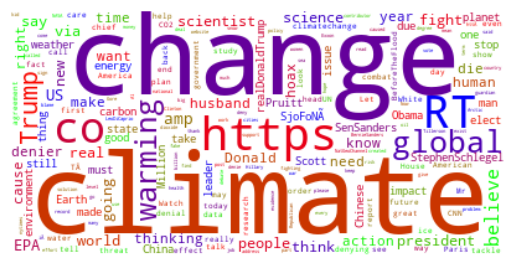

In [30]:
word_cloud = WordCloud(collocations = False, colormap = 'brg', background_color = 'white').generate(all_words)
# Display the generated Word Cloud_r
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

* `https` occurs frequently, implying that many links are being shared around the topic of climate change, most probably by the news label. 


* The tag `RT` which implies retweet appears frequently meaning that there are alot of shared opinions within the data, which is expected when you have groups of people sharing the same sentiments.


* Other common words include climate-specific vocabulary for example: `climate`, `change`, `warming` and `global`

 <a id="five"></a>
 # 5. Feature Engineering
<a href=#cont>Back to Table of Contents</a>


---

In this section, the dataset is prepared for modelling. Feature engineering is informed by the insights gathered in the EDA phase. 
The perfomance of the classification models will be largely dependent on this phase seeing as it will influence the quality of the data. 
The main inconsitency highlighted in the EDA section is the presence of duplicates. Additional pre-processing steps specific to text data will also be carried out in this stage.
This section will be done in three segments:
   * Data cleaning:
   * Dealing with class imbalance:
   * Variable creation and transformation

This stage wil ensure the transformation of the text into features that can be used with machine learning models; as well as improve the model training process and enhance model predictability. 

## 5.1 Text Cleaning

---

Removing noise (i.e. unneccesary information) is a key part of getting the data into a usable format. In this segment, the following cleaning techniques will be carried out:
* Renaming web urls

* removing duplicate tweets

* Removing the `RT` tags from tweets

* removing punctuation marks

* removing numbers from tweets

* Expanding contractions in tweets.


### 5.1.1 Rename web urls
---
The first step in the cleaning process is to rename the URL links and replace them with the string `url-web`. Urls tend to have a low occurrence individually, however, removing them would risk loss of important information like which label(s) most frequently utilize web links in their tweets; the best option then becomes renaming all web links to a common symbol such as url-web.

In [31]:
# Rename all individual links to common word, url-web
pattern_url = r'http[s]?://(?:[A-Za-z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9A-Fa-f][0-9A-Fa-f]))+'
subs_url = r'url-web'
train_df['message'] = train_df['message'].replace(to_replace = pattern_url, value = subs_url, regex = True)

### 5.1.2 Drop duplicate tweets
---
Duplicate values add redundancy to data. In this step, duplicate records are deleted by keeping just one occurrence of any unique observation in the data. 

In [32]:
# Drop duplicate tweets and keep only the first occurrence
train_df.drop_duplicates(subset = 'message', keep = 'first',inplace = True)

### 5.1.3 Remove the retweet tags from tweets
---
Retweets are reposted messages on Twitter. They are indicated by the `RT` tag. In this step, the tag is removed as it does not add any semantic value.

In [33]:
train_df['message'] = train_df['message'].str.replace('RT', '') 

### 5.1.4 Remove numbers from tweets
---
Numbers will also be removed because they do not carry any semantic value.

In [34]:
train_df['message'] = train_df['message'].str.replace('\d+', '', regex=True)#numbers

### 5.1.5 Remove punctuation marks from the dataset
---
Punctuations also do not add any information and will be removed in this step.

In [35]:
# Create a function to remove punctuation from the dataset
def punc_remover(message):
    return ''.join([l for l in message if l not in string.punctuation])

train_df['message'] = train_df['message'].apply(punc_remover)

### 5.1.6 Expand contractions in tweets

---
Contractions are words or combinations of words which are shortened by dropping letters and replacing them with an apostrophe. Removing contractions contributes to text standardization and is therefore useful in eliminating text redundancy. It also improves computational costs by reducing the dimensionality of the document-term matrix.

In [36]:
train_df['message']=train_df['message'].apply(lambda x: [contractions.fix(word) for word in x.split()])
train_df['message'] = train_df['message'].apply(lambda x: ' '.join([item for item in x]))

In [37]:
# Preview clean dataset
train_df

,sentiment,message,tweetid
0,1,PolySciMajor EPA chief does not think carbon d...,625221
1,1,Its not like we lack evidence of anthropogenic...,126103
2,2,RawStory Researchers say we have three years t...,698562
3,1,TodayinMaker WIRED was a pivotal year in the w...,573736
4,1,SoyNovioDeTodas Its and a racist sexist climat...,466954
...,...,...,...
15812,1,SierraClub hottest year in history Also in Mem...,989478
15814,1,ezlusztig They took down the material on globa...,22001
15816,0,notiven nytimesworld What does Trump actually ...,384248
15817,-1,sarasmiles Hey liberals the climate change cra...,819732


## 5.2 Dealing with Class Imbalance
---
Class imbalance occurs when the number of observations across different class labels are unevenly distributed. The EDA section highlighted the existence of class imbalance in the dataset. Class imbalance can be detrimental in the modelling phase because machine learning models will tend to be more biased towards the majority class, leading to poor classification of the minority class. In this segment of the feature engineering phase, the different class labels are balanced out.

In [38]:
# Separate the newly cleaned data into subsets as per the labels
news = train_df[train_df['sentiment']==2]
pro = train_df[train_df['sentiment']==1]
neutral = train_df[train_df['sentiment']==0]
anti = train_df[train_df['sentiment']==-1]

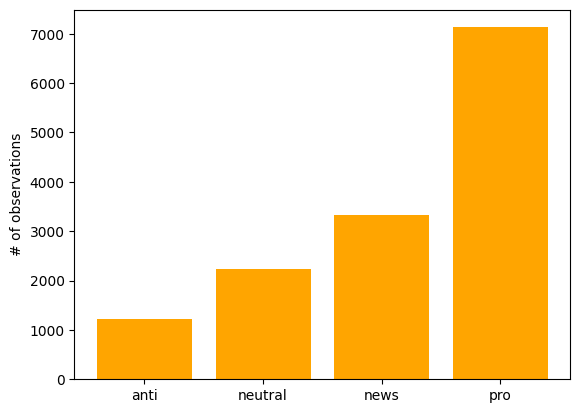

In [39]:
# Get all possible labels
labels = train_df['sentiment'].unique()
heights = [len(news),len(pro),len(neutral),len(anti)]
plt.bar(labels,heights,color='orange')
plt.xticks(labels,['news','pro','neutral','anti'])
plt.ylabel("# of observations")
plt.show()

The bar plot above indicates that there is a severe imbalance in the data. There are three approaches that can be used to correct this:

1. Upsampling the minority class(es)
2. Downsampling the majority class(es)
3. Upsample minority class + downsample majority class(es)

For this dataset, the third approach will be used since downsampling the majority(es) class will lead to a severe loss in data; while upsampling the minority classes will lead to severe duplication of data. The third technique involves:

1. Establishing a **class size** (i.e. the number of desired observations in each class). Typically, the **class size** has to be a value between the size of the majority class and the size of the minority class. A good heuristic to use here, is to **set the class size to be half the size of the majority class**.

2. Downsampling the majority class to be as small as the **class size**.

3. Upsampling the minority class to be as big as the **class size**.

In [40]:
# Calculate a class size half the size of the pro label observations
class_size = len(pro) // 2

In [41]:
class_size

3565

In [42]:
resampled_classes=[]

# Loop through the different labels and resample them accordingly
for label in list(train_df['sentiment'].unique()):
    label_data = train_df[train_df['sentiment'] == label]
    
    if label < class_size:
        label_resampled = resample(label_data,
                                   replace=True,
                                   n_samples=int(class_size),
                                   random_state=27) 
    else:      
        label_resampled = resample(label_data,
                                   replace=False, # sample without replacement (no need to duplicate observations)
                                   n_samples=int(class_size), # match number in minority class
                                   random_state=27) # reproducible results
    resampled_classes.append(label_resampled)


resampled_data = pd.concat(resampled_classes, axis=0)

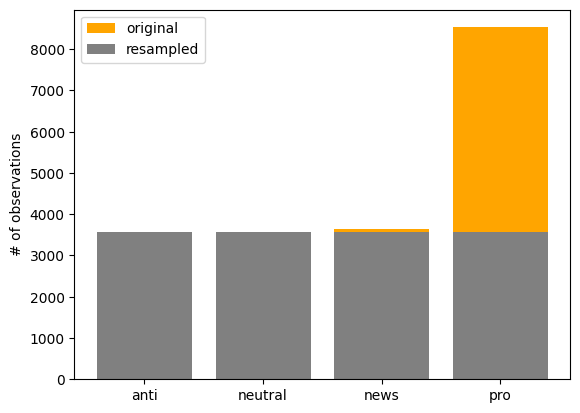

In [43]:
#Preview the new labels
labels = train_df['sentiment'].unique()
heights = [len(news_data),len(pro_data),len(neutral_data),len(anti_data)]
resampled_heights= [len(resampled_data[resampled_data['sentiment']==2]),
                    len(resampled_data[resampled_data['sentiment']==1]),
                    len(resampled_data[resampled_data['sentiment']==0]),
                    len(resampled_data[resampled_data['sentiment']==-1])]
plt.bar(labels,heights,color='orange')
plt.bar(labels,resampled_heights,color='grey')
plt.xticks(labels,['news','pro','neutral','anti'])
plt.ylabel("# of observations")
plt.legend(['original','resampled'])
plt.show()

At this point, the data is successfully balanced and ready for the next phase of the data pre-processing

## 5.3 Variable Creation and Transformation
---
After cleaning and resampling, the data is split into features and labels; in essence, the x and y variables. In this case, the feature is the `message` column while the label is the `sentiment` column.

Afterwards, the feature variable is vectorized; transforming the text data into a matrix of numbers that can be fed into a machine learning model. The data is then split into train and test sets for model evaluation

In [44]:
# Split data into features and labels
corpus=resampled_data['message']
y=resampled_data['sentiment']

In [45]:
# Instantiate a vectorizer object
vect = TfidfVectorizer(max_df=0.9, min_df=1, ngram_range=(1, 3))

# Fit and transform the text data into a matrix of vectors
X = vect.fit_transform(corpus)

print(X.shape)

(14260, 163608)


In [46]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = 42)

 <a id="six"></a>
 # 6. Model Building
 <a href=#cont>Back to Table of Contents</a>

---

In this section, classification models that are able to predict the sentiment of a tweet are built.
The different types of models created are: logistic regression, support vector classifier, decision tree, random forest, K nearest neighbors and linear support vector classifier

## 6.1 Logistic Regression model 

---

Logistic regression is a parametric supervised learning classification algorithm used to predict the probability of an observation belonging to a certain class. It works well for binary data but can be tuned to work for multiclass data by setting the `multi_class` parameter to `ovr` which impelements the one-vs-rest approach; meaning that separate logistic regression models are trained for each label that the response variable takes on.

In [47]:
# Instantiate a logistic regression object and fit a model using the training data
logreg = LogisticRegression(multi_class='ovr')
logreg.fit(X_train, y_train)

LogisticRegression(multi_class='ovr')

In [48]:
# Generate y predictions using the unseen data
pred_lr = logreg.predict(X_test)

## 6.2 Support Vector Classifier model

---

SVCs or C-Support Support Vector Machines are machine learning models used for classification and regression problems. They can solve linear and non-linear problems. The basic idea of the algorithm is to create a line or hyperplane which separates the data. In essence, it creates a decision boundary such that the points are separated into labels/classes.

In [49]:
# Instantiate a SVC object and fit a model using the training data
svc = SVC()
svc.fit(X_train, y_train)

SVC()

In [50]:
# Generate y predictions using the unseen data
pred_svc = svc.predict(X_test)

## 6.3 Decision Tree model

---

A decision tree is a non-parametric supervised learning algorithm, which is used for both classification and regression tasks. It creates the classification model by 'growing' a decision tree which consist of root nodes, branches and leaf nodes. Each node represents a test on an attribute, each branch descending from a node corresponds to one of the possible values for that attribute.

In [51]:
# Instantiate a decision tree object and fit a model using the training data
tree = DecisionTreeClassifier(random_state=42)
tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [52]:
# Generate y predictions using the unseen data
pred_tree= tree.predict(X_test)

## 6.4 Random Forest Classification model

---
A random forest is a non-parametric algorithm that is an ensemble method built on decision trees. Ensemble learning methods combine predictions from multiple machine learning algorithms to make a more accurate prediction than a single model. It is also not susceptible to overfitting

In [53]:
# Instantiate a random forest object and fit a model using the training data
rf= RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [54]:
# Generate y predictions using the unseen data
pred_rf = rf.predict(X_test)

## 6.5 K Nearest Neighbors

---
KNN works by assigning a data point to the majority class of the N-closest neighbors. N being a value that is specified by the user as input. In KNN classification, the output is a class membership


In [55]:
# Instantiate a KNN object and fit a model using the training data
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=1)

In [56]:
# Generate y predictions using the unseen data
pred_knn = knn.predict(X_test)

## 6.6 Linear SVC model

---
It is a type of support vector classifier model that uses liblinear to scale features. It takes both linear and sparse inputs and therefore it is effective on outputs from countvectorizer and tfidf vectorizer. It also allows flexibility on the loss function and penalties. Linear SVC scales better to large number of samples than SVC



In [57]:
# Instantiate a Linear SVC object and fit a model using the training data
lsvc= LinearSVC(C=100)
lsvc.fit(X_train, y_train)

C:\Users\Mariam\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


LinearSVC(C=100)

In [58]:
# Generate y predictions using the unseen data
pred_lsvc = lsvc.predict(X_test)

<a id="seven"></a>
 ## 7. Model Evaluation
 <a href=#cont>Back to Table of Contents</a>
 
---
In this section, the performance of the various trained models are compared by assessing the degree of predictability of each model on a holdout dataset. This is done by calculating performance metrics such as:

* F1 score

* Accuracy

* Precision 

* Recall

In [59]:
print('Tree classification model')
print(classification_report(y_test, pred_tree))
print('\n')

print('logistice regression model (no selection)')
print(classification_report(y_test, pred_lr))
print('\n')

print('Random Forest Classification')
print(classification_report(y_test, pred_rf))
print('\n')

print('SVC model')
print(classification_report(y_test, pred_svc))
print('\n')


print('KNN Classification model')
print(classification_report(y_test, pred_knn))
print('\n')

print('Linear SVC Classification model')
print(classification_report(y_test, pred_lsvc))
print('\n')

Tree classification model
              precision    recall  f1-score   support

          -1       0.88      0.96      0.92       340
           0       0.84      0.87      0.86       393
           1       0.82      0.72      0.76       346
           2       0.87      0.86      0.86       347

    accuracy                           0.85      1426
   macro avg       0.85      0.85      0.85      1426
weighted avg       0.85      0.85      0.85      1426



logistice regression model (no selection)
              precision    recall  f1-score   support

          -1       0.94      0.92      0.93       340
           0       0.86      0.84      0.85       393
           1       0.83      0.74      0.78       346
           2       0.81      0.93      0.87       347

    accuracy                           0.86      1426
   macro avg       0.86      0.86      0.86      1426
weighted avg       0.86      0.86      0.86      1426



Random Forest Classification
              precision    re

Remedying the class imbalance has ensured that the models are efficient at predicting all the classes. However, all the models are better at predicting the anti label. This might be because of the duplication of observations during resampling; the models become better at classifying the label due to the repeated observations. The same can be said for the neutral and news labels. 

 <a id="eight"></a>
 ## 8. Model Selection
 <a href=#cont>Back to Table of Contents</a>
 
--- 
The best performing model is going to be selected based on the f1 score. The f1 score is the harmonic mean between precision and recall metrics. The f1 score calculated in this section will be micro f1 score.  The f1 score is then plotted to evaluate model performance in a more visually-appealing manner.

In [60]:
tree_classifier=f1_score(y_test, pred_tree, average='micro')
log_regression=f1_score(y_test, pred_lr, average='micro')
random_forest=f1_score(y_test, pred_rf, average='micro')
SVC=f1_score(y_test, pred_svc, average='micro')
KNN=f1_score(y_test, pred_knn, average='micro')
LinearSVC=f1_score(y_test, pred_lsvc, average='micro')

In [61]:
results_dict={'F1_Score':
              {
           'tree_classifier':tree_classifier,
           'log_regression':log_regression,
           'random_forest':random_forest,
           'SVC':SVC,
           'KNN' : KNN,
           'LinearSVC' : LinearSVC
              }
             }

results_df = pd.DataFrame(data=results_dict)
# View the results
results_df

,F1_Score
KNN,0.844320
LinearSVC,0.906031
SVC,0.894811
log_regression,0.858345
random_forest,0.878682
tree_classifier,0.852034


In [62]:
px.bar(results_df, y =results_df['F1_Score'],
       color = results_df.index, width =700, height=400)

The output above shows that the best performing model is the Linear SVC model with 0.91% accuracy in predicting tweet sentiments, followed closely by the SVC model model and the Random Forest model.

 <a id="nine"></a>
# 9. Conclusion
<a href=#cont>Back to Table of Contents</a>
 
---
More than half of the tweets examined support the belief in man-made climate change. Majority of tweets about climate change accross all classes involve the Paris agreement, COP22 and Donald Trump. Climate change has become a politicized issue with the anti label favouring Republican-leaning users while the other labels are favored by Democrat-leaning users. The mentioned usernames also suggests that users are trying to interact with other users that share their sentiments on climate change.

A TF-IDF vectorizer was used to compute a weight for each word token by its level of importance and vectorize it. A max_df of 0.9 removes the most frequent words and a min_df of 1 removes words which appear less than once in the data. Six models were trained on 90% of the train data and validated on the remaining 10%. The best model was the Linear SVC model which performed best according to both the validation set from the train/test split and the unseen test set.

Sentiment analyses such as this one help companies gauge the feelings of the population on certain issues, in this case, climate change, to better inform their operations and strategies; including production and marketing. Based on the data, majority of the population believes in man-made climate change and will therefore be appreciative of environmentally-friendly operations and products. 

To interact with the models, generated visuals and to get latest news on climate change, visit our streamlit app on [this link](http://54.217.59.159:5000/)


<a id="ten"></a>
# 10. Kaggle Submission
<a href=#cont>Back to Table of Contents</a>
 
---

In this last section, the models are submitted to kaggle to assess their performance on unseen data. The first portion of this part is cleaning, vectorizing and fitting the model on the test data, then creating a csv file for submission to kaggle.

In [63]:
# Rename all individual links to common word, url-web
test_df['message'] = test_df['message'].replace(to_replace = pattern_url, value = subs_url, regex = True)

In [64]:
test_df['message'] = test_df['message'].str.replace('RT', '') #remove the retweet tag drom tweets
test_df['message'] = test_df['message'].str.replace('\d+', '', regex=True)#remove numbers
test_df['message'] = test_df['message'].apply(lambda x: [contractions.fix(word) for word in x.split()])#expand contractions
test_df['message'] = test_df['message'].apply(lambda x: ' '.join([item for item in x]))

In [65]:
# remove punctuation marks from the dataset
def punc_remover(message):
    return ''.join([l for l in message if l not in string.punctuation])

test_df['message'] = test_df['message'].apply(punc_remover)

In [66]:
#Transform the features to a format that a machine learning model can understand
X_test=test_df['message']
X_test_df = vect.transform(X_test)

In [67]:
# Generate predictions on the unseen data
pred_test = lsvc.predict(X_test_df)

In [68]:
# Create csv submission file

tweet_id=test_df['tweetid']
model_test_df = pd.DataFrame({'sentiment':pred_test,'tweetid':tweet_id})


model_test_df.to_csv('submission.csv', index=False)

model_test_df.head(10)

,sentiment,tweetid
0,2,169760
1,1,35326
2,1,224985
3,1,476263
4,0,872928
5,1,75639
6,1,211536
7,2,569434
8,1,315368
9,1,591733


<a id="eleven"></a>
# 11. Log Comet Experiments 
<a href=#cont>Back to Table of Contents</a>

---

Comet will be used for version control and to log the different models that will be created.


In [69]:
#from comet_ml import Experiment
#experiment = Experiment(
#    api_key="aPWNx70DxppXNxgoHjYdV9tWV",
#    project_name="team-cw4-explore-ai-twitter-sentiment-analysis",
#    workspace="layomi19",
#)

COMET WARNING: Comet has disabled auto-logging functionality as it has been imported after the following ML modules: xgboost, sklearn. Metrics and hyperparameters can still be logged using comet_ml.log_metrics() and comet_ml.log_parameters()
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Experiment is live on comet.com https://www.comet.com/layomi19/team-cw4-explore-ai-twitter-sentiment-analysis/42e9e84400ad4b348f1aeb0fc98ff673



In [70]:
# Saving each metric to add to a dictionary for logging
#f1 = f1_score(y_test, pred_lsvc, average='micro')
#precision = precision_score(y_test, pred_lsvc, average='micro')
#recall = recall_score(y_test, pred_lsvc, average='micro')

# Create dictionaries for the data we want to log          
#metrics = {"f1": f1,
#           "recall": recall,
#           "precision": precision}

#params= {'classifier': 'Linear SVC',
#         'max_df': 0.9,
#         'min_df': 1,
#         'ngram_range': '(1,3)',
#         'C' : 100,
#         'vectorizer': 'Tfidf',}
  
# Log info on comet
#experiment.log_metrics(metrics)
#experiment.log_parameters(params)

# End experiment
#experiment.end()

# Display results on comet page
#experiment.display()

COMET INFO: ---------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     url                   : https://www.comet.com/layomi19/team-cw4-explore-ai-twitter-sentiment-analysis/42e9e84400ad4b348f1aeb0fc98ff673
COMET INFO:   Metrics:
COMET INFO:     f1        : 0.906030855539972
COMET INFO:     precision : 0.906030855539972
COMET INFO:     recall    : 0.906030855539972
COMET INFO:   Parameters:
COMET INFO:     C           : 100
COMET INFO:     classifier  : Linear SVC
COMET INFO:     max_df      : 0.9
COMET INFO:     min_df      : 1
COMET INFO:     ngram_range : (1,3)
COMET INFO:     vectorizer  : Tfidf
COMET INFO:   Uploads:
COMET INFO:     environment details      : 1
COMET INFO:     filename                 : 1
COMET INFO:     git metadata             : 1
COMET INFO:     git-patch (uncompressed) : 1 (26.89 MB)
COMET INFO:     installed packages       : 1
COMET IN